In [128]:
import scipy as sp
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import scipy.io as sio
from scipy.interpolate import interp1d
import math
from scipy import stats
import glob
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC 
import shutil
import os
from sklearn.metrics import roc_auc_score

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 4),
         'axes.labelsize': 'large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
pylab.rcParams.update(params)

plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False


# Load data and setup

In [129]:
from analysis_functions import *
from plotting_functions import *

### Define parameters

In [136]:
monkey = 'Stanton'

In [137]:
# PATHS
datapath = 'E:\\two_boundary\\original_data\\'
figpath = 'E:\\two_boundary\\figures\\'
datapathsave = 'E:\\two_boundary\\data\\'

brain_areas = ['MT', 'MST', 'LIP', 'SC']

# BRAIN AREAS
#if monkey == 'Neville':
#    brain_areas = ['MT', 'MST', 'LIP']
#else:
#    brain_areas = ['MST', 'LIP']

# BINNING/SMOOTHING PARAMETERS
bins = np.arange(-500, 3051)
sm_std = 30 # gaussian smoothing stdev
bin_size = 100 # msec for binend data

# MIN NUM TRIALS FOR INCLUSION
min_ntrials = 8

# MIN NEURON RATING FOR INCLUSION
min_rating = 2.5

In [138]:
center_dirs = [i for i, val in enumerate(DIRS) if isinstance(val, int)]
center_dir_names = [DIRS[i] for i in center_dirs]

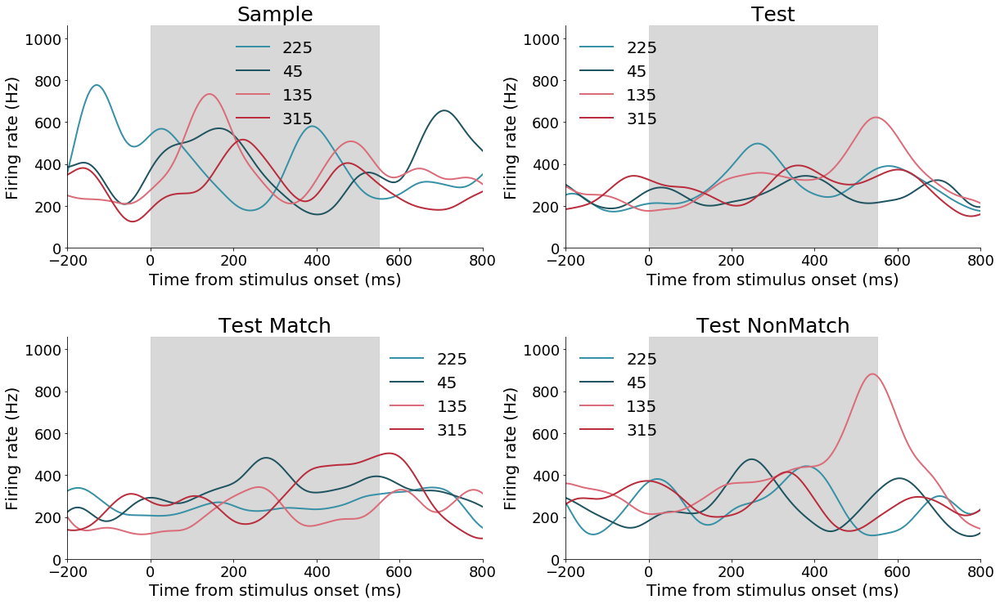

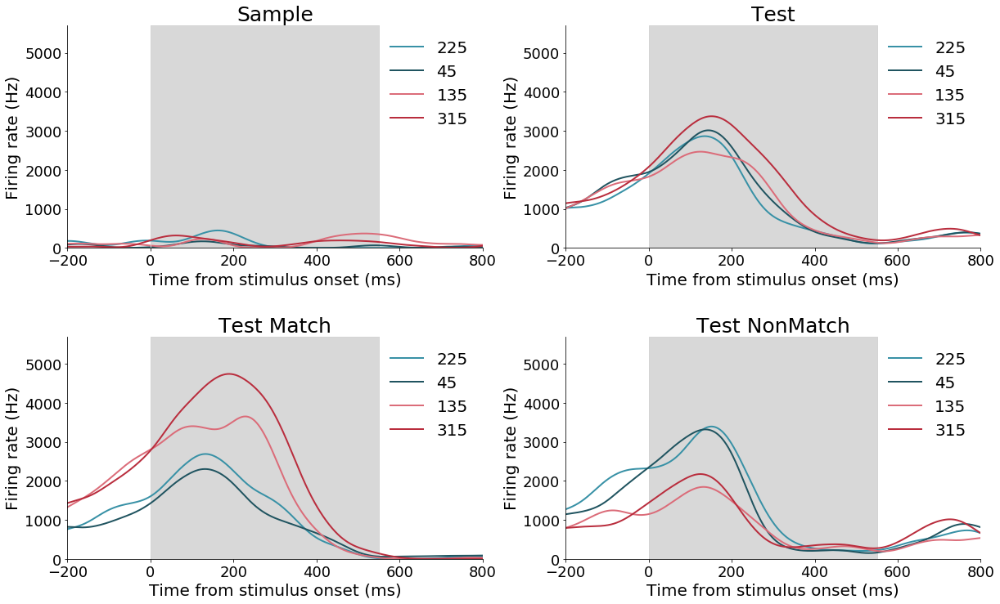

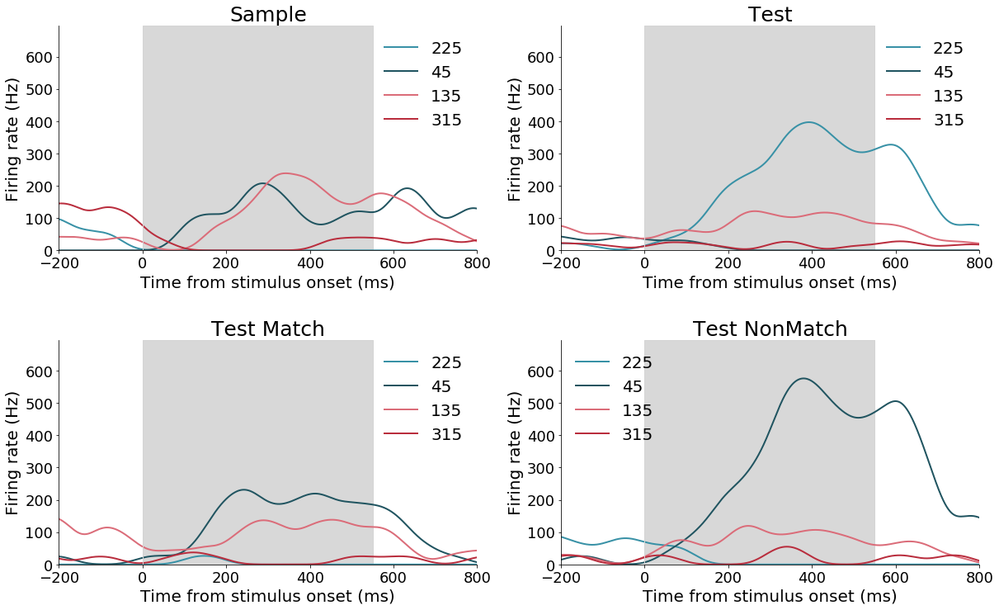

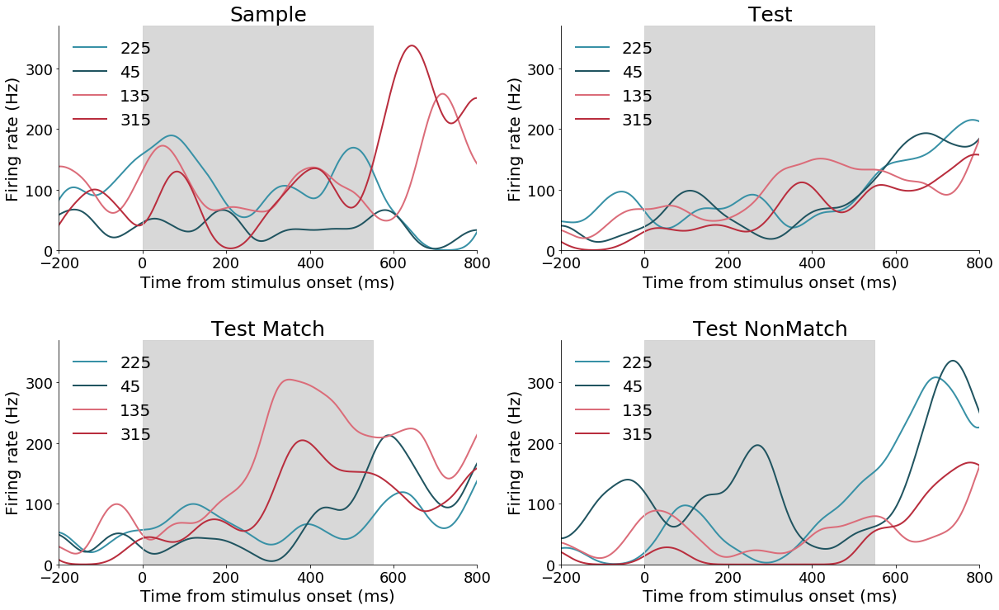

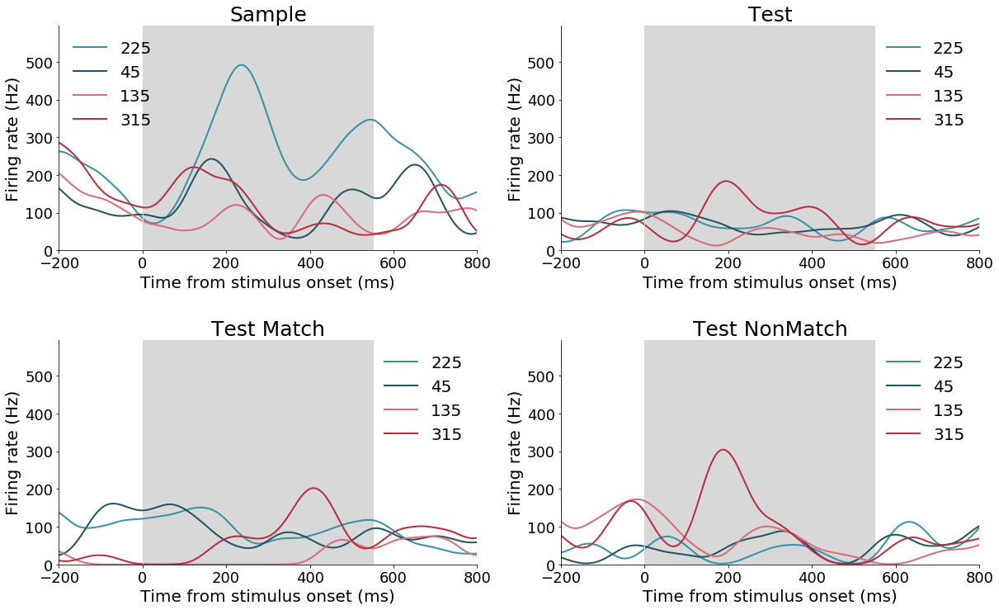

...

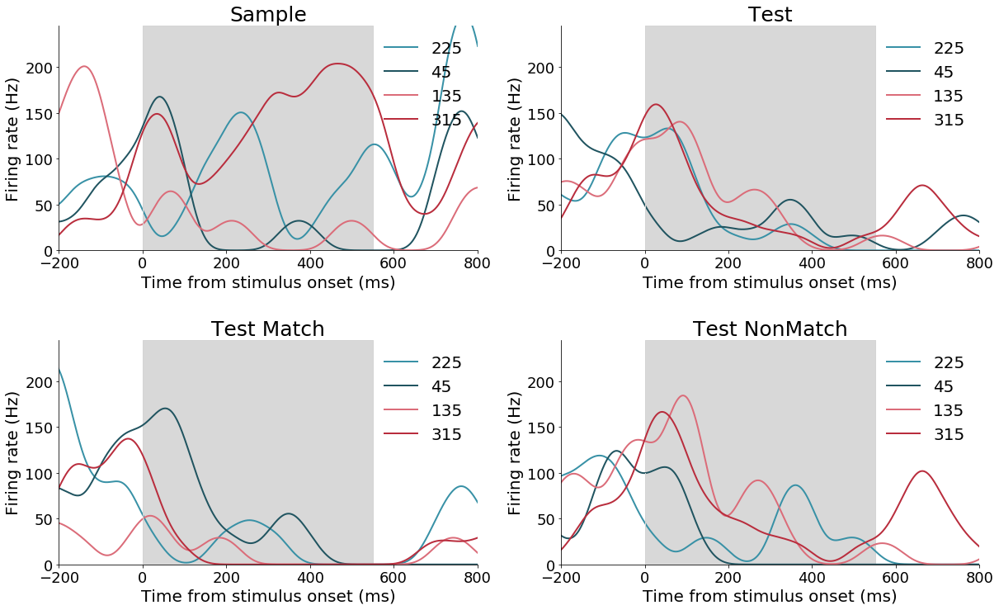

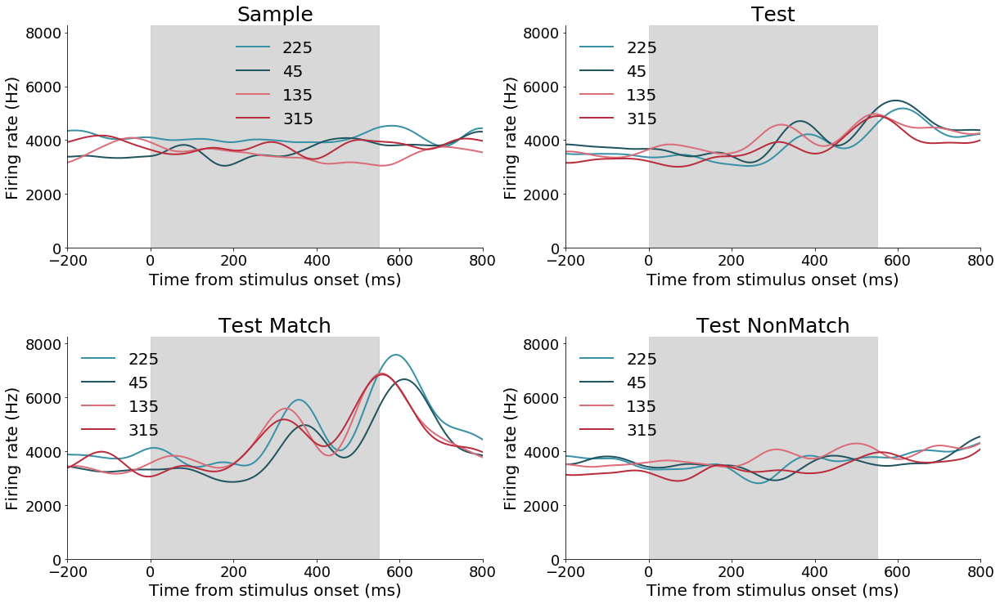

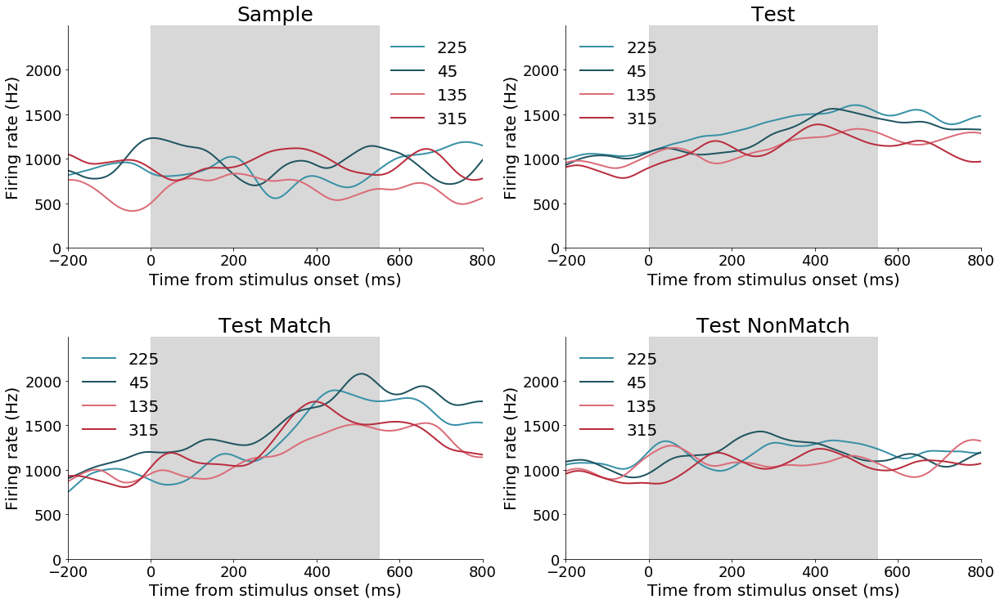

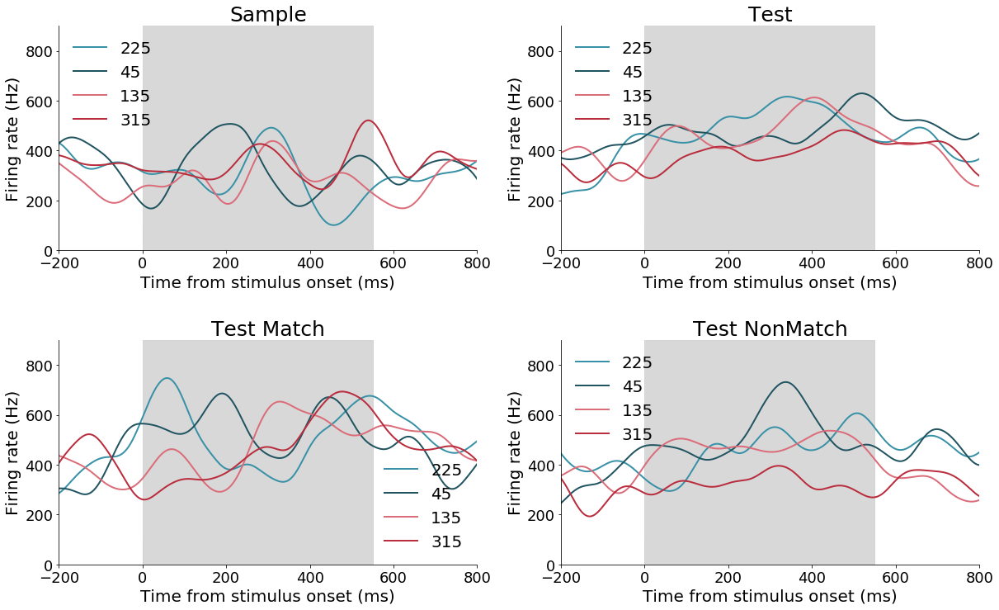

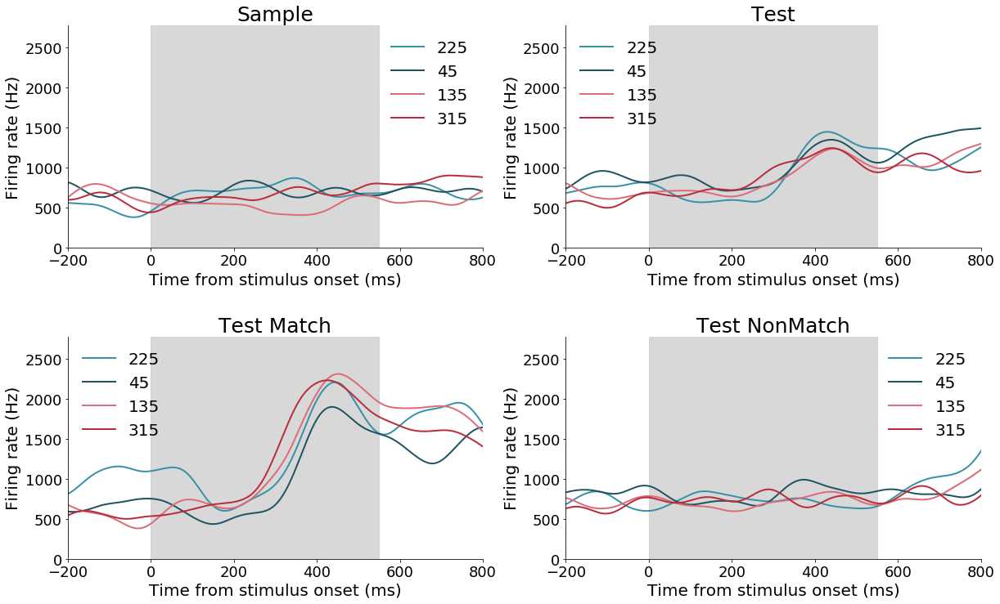

In [141]:
cat_svm_perf = {}

for area in brain_areas[3:]: 
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)
    
    n_neurons_decoder = len(filelist)
    spikes_all = []

    for file in filelist:
        data = sio.loadmat(file)['binned_spikes'][0]
        
        all_data = {'Sample': [], 'Test': [], 'Test Match': [], 'Test NonMatch': []}
        
        [data_by_test, data_by_test_sample] = org_data_by_test(data)
        min_nt = min([len(i) for i in data_by_test])
        data_by_test = [i[0:min_nt] for i in data_by_test]
        all_data['Test'] = data_by_test
        all_data['Test Match'] = [data_by_test_sample[i] for i in np.arange(0, 8, 2)]
        all_data['Test NonMatch'] = [data_by_test_sample[i] for i in np.arange(1, 8, 2)]
        data_by_sample = org_data_by_dir(data)
        all_data['Sample'] = [data_by_sample[i] for i in center_dirs]
        
        #data_by_test_sample_80trials = [i[0:55, :] for i in data_by_test_sample]
        
        spikes_all.append(data_by_test_sample)
        
        
        fig, ax =  plt.subplots(2, 2, figsize=(20, 12))
        fig.subplots_adjust(hspace = 0.4)

        colors = [plot_colors['Category1'], '#205460', plot_colors['Category2'], '#b92d3d']
        max_y = 0
        bins_plotting = [bins[:-1], bins[:-1]-DELAY1, bins[:-1]-DELAY1]
        xlims = [[0,SAMPLE_STIM], [DELAY1, TEST1], [DELAY1, TEST1]]

        keys = list(all_data.keys())

        for i in range(2):
            key = keys[i]

            for ii, dir in enumerate(center_dir_names):

                curr_data = gaussian_filter1d(np.mean(all_data[key][ii], 0)*1000, sm_std)
                ax[0, i].plot(bins_plotting[i], curr_data, color = colors[ii], lw = 2, label = dir)
                ax[0, i].set_xlim(-200, 800)
                ax[0, i].tick_params(labelsize = 18)
                ax[0, i].plot([0, 0], [0, 100], 'lightgrey', lw = 1)
                ax[0, i].axvspan(0, 550, alpha = 0.4, color = 'lightgrey', zorder=1)

                ax[0, i].set_title(key, fontsize = 25)
                ax[0, i].set_xlabel('Time from stimulus onset (ms)', fontsize = 20)
                ax[0, i].set_ylabel('Firing rate (Hz)', fontsize = 20)
                ax[0, i].legend(frameon = False, fontsize = 20)

                ax[0, i].spines['right'].set_visible(False)
                ax[0, i].spines['top'].set_visible(False)

                if max(curr_data[xlims[i][0]-bins[0]:xlims[i][1]-bins[0]]) > max_y:
                    max_y = max(curr_data[xlims[i][0]-bins[0]:xlims[i][1]-bins[0]])


        for i in range(2):
            key = keys[i+2]

            for ii, dir in enumerate(center_dir_names):

                curr_data = gaussian_filter1d(np.mean(all_data[key][ii], 0)*1000, sm_std)
                ax[1, i].plot(bins_plotting[2], curr_data, color = colors[ii], lw = 2, label = dir)
                ax[1, i].set_xlim(-200, 800)
                ax[1, i].tick_params(labelsize = 18)
                ax[1, i].plot([0, 0], [0, 100], 'lightgrey', lw = 1)
                ax[1, i].axvspan(0, 550, alpha = 0.4, color = 'lightgrey', zorder=1)

                ax[1, i].set_title(key, fontsize = 25)
                ax[1, i].set_xlabel('Time from stimulus onset (ms)', fontsize = 20)
                ax[1, i].set_ylabel('Firing rate (Hz)', fontsize = 20)
                ax[1, i].legend(frameon = False, fontsize = 20)

                ax[1, i].spines['right'].set_visible(False)
                ax[1, i].spines['top'].set_visible(False)

                if max(curr_data[xlims[2][0]-bins[0]:xlims[2][1]-bins[0]]) > max_y:
                    max_y = max(curr_data[xlims[2][0]-bins[0]:xlims[2][1]-bins[0]])

        max_y = int(np.ceil(max_y*1.2/5.0)*5.0)

        for i in range(2):
            ax[0, i].set_ylim(0, max_y)
            ax[1, i].set_ylim(0, max_y)

        plt.show()
        plt.close()
        fname = 'E:\\two_boundary\\figures\\test_period\\Stanton\\' + area + '\\' + file[0:-4] + '_psth' + '.png'
        fig.savefig(fname, bbox_inches='tight')
        


In [ ]:
# ind_per_cat:
    # True: independent decoders per category
    # False: include all directions in single decoder
clf = SVC(kernel='linear')

# Run decoder every 10ms
n_timepoints = len(timepoints)-1
decoder_timepoints = np.arange(0, n_timepoints, 10)

# Pre-allocate to save decoder performance
perf_all = np.zeros([n_iter, len(decoder_timepoints)])

# Define directions for training/testing
all_configs = [[[0, 2], [1, 3]], [7, 9, ]]

all_configs['train_data_c1'] = [[0], [2], [0], [2]]
all_configs['train_data_c2'] = [[4], [6], [6], [4]]
all_configs['test_data_c1'] = [[2], [0], [2], [0]]
all_configs['test_data_c2'] = [[6], [4], [4], [6]]
groups = ['train_data_c1', 'train_data_c2', 'test_data_c1', 'test_data_c2']
    
groups = ['train', 'test']

n_dirs_decoder = len(all_configs[0])
n_trials_test = int(n_trials/k_fold) * n_dirs_decoder
n_trials_train = (n_trials - int(n_trials/k_fold)) * n_dirs_decoder

for iteration in range(n_iter):

    # Choose subset of neurons (if sub-sampling)
    #subsampled_data = sample(all_data, n_neurons_decoder)
    neurons = np.random.choice(n_neurons_total, n_neurons_decoder, replace=False)

    # Choose category to tets on
    indx = np.random.randint(0, 2)
    curr_dirs = all_configs[indx]

    # Pre-allocate training and testing arrays
    svm_data = {}
    svm_data['train'] = [np.zeros([n_neurons_decoder, n_trials_train]) for i in range(n_timepoints)]
    svm_data['test'] = [np.zeros([n_neurons_decoder, n_trials_test]) for i in range(n_timepoints)]

    for i_neuron, neuron in enumerate(neurons):
        data = all_data[neuron]

        # Organize neuron's data by category and training/testing trials
        X_data, X_data_sorted = {}, {}
        y_data, y_data_sorted = {}, {}

        min_nt = min([len(data[i]) for i in curr_dirs])

        if min_nt >= n_trials:
            inds = np.vstack([np.random.choice(len(data[i]), min_nt, replace= False) for i in curr_dirs])
            Y = np.hstack([np.full(min_nt, i) for i in curr_dirs])
        else:
            inds = np.vstack([np.random.choice(len(data[i]), n_trials, replace= False) if len(data[i]) >= n_trials else np.random.choice(len(data[i]), n_trials, replace= True) for i in curr_dirs])
            Y = np.hstack([np.full(n_trials, i) for i in curr_dirs])

        if n_timepoints == 1:
            X = np.hstack([data[val][inds[i]] for i, val in enumerate(curr_dirs)])
        else:
            X = np.vstack([data[val][inds[i]] for i, val in enumerate(curr_dirs)])

        #X_data['train'], X_data['test'], y_data['train'], y_data['test'] = train_test_split(X, Y, train_size = n_trials_train, test_size = n_trials_test, stratify=Y)

        sss = StratifiedShuffleSplit(n_splits = 1, train_size = n_trials_train, test_size = n_trials_test)
        for train_index, test_index in sss.split(X, Y):
            X_data['train'], X_data['test'] = X[train_index], X[test_index]
            y_data['train'], y_data['test'] = Y[train_index], Y[test_index]

        for group in groups:
            sort = sorted([(e, i) for i, e in enumerate(y_data[group])])
            y_data_sorted[group] = [i[0] for i in sort]
            sorted_inds = [i[1] for i in sort]
            X_data_sorted[group] = X_data[group][sorted_inds]

            if n_timepoints == 1:
                svm_data[group][0][i_neuron][:] = np.hstack(X_data_sorted[group])
            else:
                for ii in range(n_timepoints):
                    svm_data[group][ii][i_neuron][:] = X_data_sorted[group][:, ii]

    # Run decoder
    perf = np.zeros([len(decoder_timepoints)])

    for i_timepoint, timepoint in enumerate(decoder_timepoints):

        clf.fit(svm_data['train'][timepoint].T, y_data_sorted['train'])

        pred = clf.predict(svm_data['test'][timepoint].T)
        perf[i_timepoint] = sum(pred == y_data_sorted['test'])/len(y_data_sorted['test'])*100

    perf_all[iteration] = perf

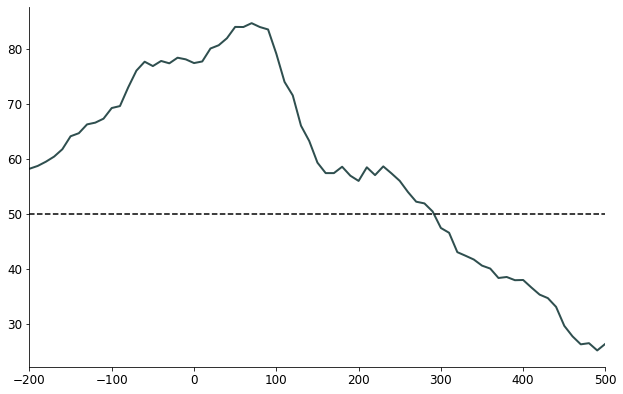

In [458]:
#for NEURON in range(len(filelist)):
all_data = spikes_all
n_iter = 100
n_neurons_decoder = len(filelist)
n_neurons_total = n_neurons_decoder
timepoints = np.arange(0, len(bins))#np.arange(np.where(bins == DELAY1-200)[0][0], np.where(bins == TEST1)[0][0])
equal_n_per_dir = True

# equal_n_per_dir: ensure that the training/testing set contains and equal number of trials per direction within a single category
clf = SVC(kernel='linear')

# Run decoder every 10ms
n_timepoints = len(timepoints)-1
decoder_timepoints = np.arange(np.where(bins == DELAY1-200)[0][0], np.where(bins == TEST1)[0][0], 10)

n_trials_per_dir = 55

# Number trials per class (category)
n_dirs_per_class = 1
n_trials_train = n_trials_per_dir*n_dirs_per_class

# Define quadrants for training/testing (4 possible combinations)
all_configs = {}
#all_configs['train_data_c1'] = [[0, 1], [2, 3], [0, 1], [2, 3]]
#all_configs['train_data_c2'] = [[4, 5], [6, 7], [6, 7], [4, 5]]
#all_configs['test_data_c1'] = [[2, 3], [0, 1], [2, 3], [0, 1]]
#all_configs['test_data_c2'] = [[6, 7], [4, 5], [4, 5], [6, 7]]

#all_configs['train_data_c1'] = [[0, 2], [5, 7], [5, 7], [0, 2]]
#all_configs['train_data_c2'] = [[1, 3], [4, 6], [1, 3], [4, 6]]
#all_configs['test_data_c1'] = [[5, 7], [0, 2], [0, 2], [5, 7]]
#all_configs['test_data_c2'] = [[4, 6], [1, 3], [4, 6], [1, 3]]

all_configs['train_data_c1'] = [[0], [2], [5], [7], [5], [7], [0], [2]]
all_configs['train_data_c2'] = [[1], [3], [4], [6], [1], [3], [4], [6]]
all_configs['test_data_c1'] = [[5], [7], [0], [2], [0], [2], [5], [7]]
all_configs['test_data_c2'] = [[4], [6], [1], [3], [4], [6], [1], [3]]

groups = ['train_data_c1', 'train_data_c2', 'test_data_c1', 'test_data_c2']

# Pre-allocate to save decoder performance
perf_all = np.zeros([n_iter, len(decoder_timepoints)])

for iteration in range(0, n_iter):

    # Choose subset of neurons (if sub-sampling)
    neurons = np.random.choice(n_neurons_total, n_neurons_decoder, replace=False)
    #neurons = [NEURON]

    # Choose a train-test config
    indx = np.random.randint(0, 8)
    curr_config = {}
    for ii, group in enumerate(groups):
        curr_config[group] = all_configs[group][indx]

    # Pre-allocate training and testing arrays
    svm_data = {}
    for group in groups:
        svm_data[group] = [np.zeros([n_neurons_decoder, n_trials_train]) for i in range(n_timepoints)]

    for i_neuron, neuron in enumerate(neurons):
        data = all_data[neuron]

         # Organize neuron's data by category and training/testing trials
        for group in groups:

            if equal_n_per_dir:
                #min_nt = min([len(i) for i in [data[curr_config[group][0]], data[curr_config[group][1]]]])
                min_nt = min([len(i) for i in [data[curr_config[group][0]]]])
                if min_nt >= n_trials_per_dir:
                    inds = np.vstack([np.random.choice(len(data[ii]), n_trials_per_dir, replace= False) for ii in curr_config[group]])
                else:
                    inds = np.vstack([np.random.choice(len(data[i]), n_trials_per_dir, replace= False) if len(data[i]) >= n_trials_per_dir else np.random.choice(len(data[i]), n_trials_per_dir, replace= True) for i in curr_config[group]])

                X = np.vstack([data[val][inds[i]] for i, val in enumerate(curr_config[group])])

            else:
                #curr_data = np.vstack([data[curr_config[group][0]], data[curr_config[group][1]]])
                curr_data = np.vstack([data[curr_config[group][0]]])
                X, Xt, y, yt = train_test_split(curr_data, np.zeros([len(curr_data)]), train_size = n_trials_per_class)

            if n_timepoints == 1:
                svm_data[group][0][i_neuron][:] = np.hstack(X)
            else:
                for ii in range(n_timepoints):
                    svm_data[group][ii][i_neuron][:] = X[:, ii]

    # Run decoder
    perf = np.ones([len(decoder_timepoints)])

    for i_timepoint, timepoint in enumerate(decoder_timepoints):

        x_train = np.hstack([svm_data['train_data_c1'][timepoint], svm_data['train_data_c2'][timepoint]])
        y_train = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

        x_test = np.hstack([svm_data['test_data_c1'][timepoint], svm_data['test_data_c2'][timepoint]])
        y_test = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

        clf.fit(x_train.T, y_train)

        pred = clf.predict(x_test.T)
        perf[i_timepoint] = sum(pred == y_test)/len(y_test)*100

    perf_all[iteration] = perf

fig = plt.figure(figsize=(8, 5))
ax = fig.add_axes([1,1,1,1])

ax.plot(np.arange(-200, 550, 10), np.mean(perf_all, 0), color = 'darkslategrey', lw = 2)
ax.plot([-200, 550], [50, 50], '--k')

ax.set_xlim(-200, 500)

plt.show()
plt.close()
#fname = 'E:\\two_boundary\\figures\\test_period\\Neville\\'  + area + '\\' + filelist[NEURON][0:-4] + '_match_nonmatch_decoder' + '.png'
fname = 'E:\\two_boundary\\figures\\test_period\\Neville\\'  + area + '_match_nonmatch_decoder' + '.png'
fig.savefig(fname, bbox_inches='tight')


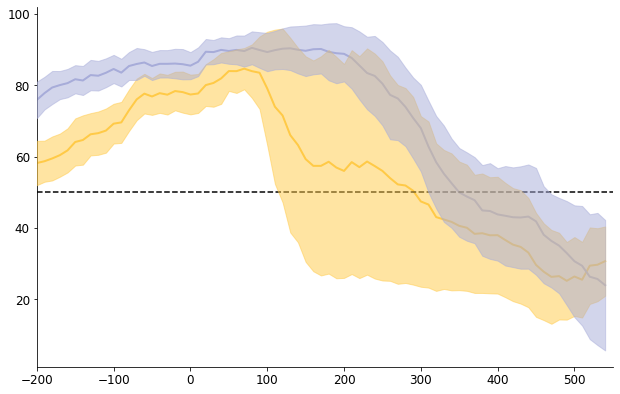

In [463]:
fig = plt.figure(figsize=(8, 5))
ax = fig.add_axes([1,1,1,1])

ax.plot(np.arange(-200, 550, 10), np.mean(perf_all, 0), color = plot_colors['MT'], lw = 2)
ax.fill_between(np.arange(-200, 550, 10), np.mean(perf_all, 0)-np.std(perf_all, 0), np.mean(perf_all, 0)+np.std(perf_all, 0), color = plot_colors['MT'],  lw = 1., alpha = 0.5, zorder=20)

ax.plot(np.arange(-200, 550, 10), np.mean(perf_all_LIP, 0), color = plot_colors['LIP'], lw = 2)
ax.fill_between(np.arange(-200, 550, 10), np.mean(perf_all_LIP, 0)-np.std(perf_all_LIP, 0), np.mean(perf_all_LIP, 0)+np.std(perf_all_LIP, 0), color = plot_colors['LIP'],  lw = 1., alpha = 0.5, zorder=20)

ax.plot([-200, 550], [50, 50], '--k')

ax.set_xlim(-200, 550)

plt.show()
plt.close()
#fname = 'E:\\two_boundary\\figures\\test_period\\Neville\\'  + area + '\\' + filelist[NEURON][0:-4] + '_match_nonmatch_decoder' + '.png'
fname = 'E:\\two_boundary\\figures\\test_period\\Neville\\LIP_MT_category_match_nonmatch_decoder' + '.png'
fig.savefig(fname, bbox_inches='tight')


(-200, 550)

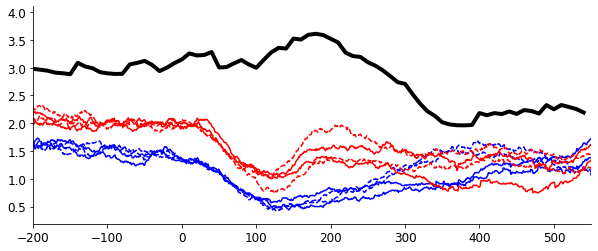

In [433]:
plt.plot(bins_plotting[2], np.mean(data[0], 0), 'b')
plt.plot(bins_plotting[2], np.mean(data[2], 0), 'b')
plt.plot(bins_plotting[2], np.mean(data[5], 0), '--b')
plt.plot(bins_plotting[2], np.mean(data[7], 0), '--b')

plt.plot(bins_plotting[2], np.mean(data[4], 0), 'r')
plt.plot(bins_plotting[2], np.mean(data[6], 0), 'r')
plt.plot(bins_plotting[2], np.mean(data[1], 0), '--r')
plt.plot(bins_plotting[2], np.mean(data[3], 0), '--r')

plt.plot(np.arange(-200, 550, 10), np.mean(perf_all/15-1, 0), 'k', lw = 4)

#plt.ylim(0, 1.3)
plt.xlim(-200, 550)

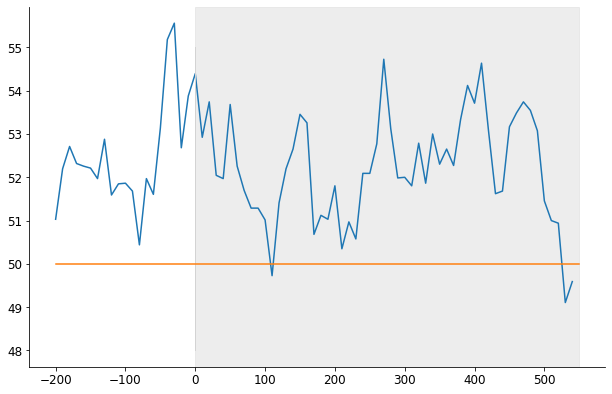

In [274]:
for iteration in range(n_iter):

    i0 = np.random.choice(len(window_cat[0][:]), min_nt_corr, replace = False)
    i1 = np.random.choice(len(window_cat[1][:]), min_nt_corr, replace = False)

    x_corr_all = np.hstack([window_cat[0][i0], window_cat[1][i1]])
    y = np.hstack([np.zeros(min_nt_corr), np.ones(min_nt_corr)])

    sss = StratifiedShuffleSplit(n_splits = 1, test_size = min_nt_err*2)
    for train_index, test_index in sss.split(x_corr_all, y):
        Xtrain, Xtest_corr = x_corr_all[train_index], x_corr_all[test_index]
        ytrain, ytest_corr = y[train_index], y[test_index]

    Xtrain = Xtrain.reshape(-1, 1)
    Xtest_corr = Xtest_corr.reshape(-1, 1)

    i0 = np.random.choice(len(window_cat_err[0][:]), min_nt_err, replace = False)
    i1 = np.random.choice(len(window_cat_err[1][:]), min_nt_err, replace = False)

    y_test_err = np.hstack([np.zeros(min_nt_err), np.ones(min_nt_err)])
    x_test_err = np.hstack([window_cat_err[0][i0], window_cat_err[1][i1]])
    x_test_err = x_test_err.reshape(-1, 1)

    clf = SVC(kernel='linear')
    clf.fit(Xtrain, ytrain)

    pred = clf.predict(Xtest_corr)
    corr_perf[iteration] = sum(pred == ytest_corr)/len(ytest_corr)*100    

# Category decoder

In [142]:
monkey = 'Stanton'

In [143]:
cat_svm_perf = {}

for area in brain_areas[3:]: 
    currpath = datapathsave + monkey + '\\' + area + '\\good_neurons\\task_responsive\\'

    os.chdir(currpath)
    filelist = [f for f in glob.glob("*.mat")]
    n_files = len(filelist)
    
    n_neurons_decoder = len(filelist)
    spikes_all = []

    for file in filelist:
        data = sio.loadmat(file)['binned_spikes'][0]
                
        [data_by_test, data_by_test_sample] = org_data_by_test(data)
        spikes_all.append(data_by_test)


In [144]:
np.shape(spikes_all)

(70, 4)

In [148]:
timepoints = range(np.where(bins >= DELAY1-100)[0][0], np.where(bins >= DELAY1-100)[0][0]+650)
n_iter = 50
n_neurons_total = 70
all_data = spikes_all
equal_n_per_dir = 1

In [149]:
# equal_n_per_dir: ensure that the training/testing set contains and equal number of trials per direction within a single category
clf = SVC(kernel='linear')
n_trials_per_dir = 20

# Run decoder every 10ms
n_timepoints = len(timepoints)-1
decoder_timepoints = np.arange(0, n_timepoints, 10)

# Number trials per class (category)
n_dirs_per_class = 1
n_trials_train = n_trials_per_dir*n_dirs_per_class

# Define quadrants for training/testing (4 possible combinations)
all_configs = {}
all_configs['train_data_c1'] = [[0], [1], [0], [1]]
all_configs['train_data_c2'] = [[2], [3], [3], [2]]
all_configs['test_data_c1'] = [[1], [0], [1], [0]]
all_configs['test_data_c2'] = [[3], [2], [2], [3]]
groups = ['train_data_c1', 'train_data_c2', 'test_data_c1', 'test_data_c2']

# Pre-allocate to save decoder performance
perf_all = np.zeros([n_iter, len(decoder_timepoints)])

for iteration in range(0, n_iter):

    # Choose subset of neurons (if sub-sampling)
    neurons = np.random.choice(n_neurons_total, n_neurons_decoder, replace=False)

    # Choose a train-test config
    indx = np.random.randint(0, 4)
    curr_config = {}
    for ii, group in enumerate(groups):
        curr_config[group] = all_configs[group][indx]

    # Pre-allocate training and testing arrays
    svm_data = {}
    for group in groups:
        svm_data[group] = [np.zeros([n_neurons_decoder, n_trials_train]) for i in range(n_timepoints)]

    for i_neuron, neuron in enumerate(neurons):
        data = all_data[neuron]

         # Organize neuron's data by category and training/testing trials
        for group in groups:

            if equal_n_per_dir:
                min_nt = min([len(i) for i in [data[curr_config[group][0]]]])

                if min_nt >= n_trials_per_dir:
                    inds = np.vstack([np.random.choice(len(data[ii]), n_trials_per_dir, replace= False) for ii in curr_config[group]])
                else:
                    inds = np.vstack([np.random.choice(len(data[i]), n_trials_per_dir, replace= False) if len(data[i]) >= n_trials_per_dir else np.random.choice(len(data[i]), n_trials_per_dir, replace= True) for i in curr_config[group]])

                X = np.vstack([data[val][inds[i]] for i, val in enumerate(curr_config[group])])

            else:
                curr_data = np.vstack([data[curr_config[group][0]], data[curr_config[group][1]], data[curr_config[group][2]]])
                X, Xt, y, yt = train_test_split(curr_data, np.zeros([len(curr_data)]), train_size = n_trials_per_class)

            if n_timepoints == 1:
                svm_data[group][0][i_neuron][:] = np.hstack(X)
            else:
                for ii in range(n_timepoints):
                    svm_data[group][ii][i_neuron][:] = X[:, ii]

    # Run decoder
    perf = np.ones([len(decoder_timepoints)])

    for i_timepoint, timepoint in enumerate(decoder_timepoints):

        x_train = np.hstack([svm_data['train_data_c1'][timepoint], svm_data['train_data_c2'][timepoint]])
        y_train = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

        x_test = np.hstack([svm_data['test_data_c1'][timepoint], svm_data['test_data_c2'][timepoint]])
        y_test = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

        clf.fit(x_train.T, y_train)

        pred = clf.predict(x_test.T)
        perf[i_timepoint] = sum(pred == y_test)/len(y_test)*100

    perf_all[iteration] = perf


(40, 70)

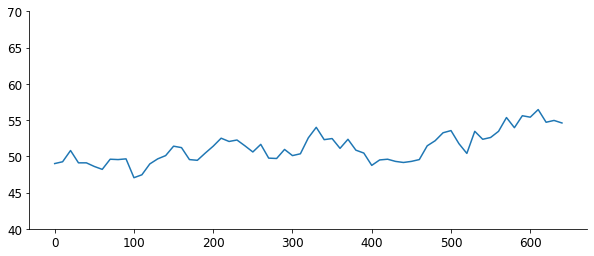

In [150]:
plt.plot(decoder_timepoints, np.mean(perf_all, 0))
plt.ylim(40, 70)